In [48]:
import pandas as pd
import numpy as np

# Fixer le nombre total de lignes
num_rows = 1000

# Générer des dates aléatoires sur une année (2023)
dates = pd.date_range(start="2023-01-01", end="2023-12-31", freq="h")  # Observations horaires
random_dates = np.random.choice(dates, num_rows, replace=True)  # Sélection aléatoire parmi ces dates

# Générer des données météorologiques aléatoires
np.random.seed(42)  # Pour des résultats reproductibles

# Températures en °C (variation avec bruit)
temperature = np.round(10 + 15 * np.sin(2 * np.pi * pd.to_datetime(random_dates).dayofyear / 365) + 
                        np.random.normal(0, 3, num_rows), 1)

# Précipitations en mm (valeurs discrètes, majorité des jours secs)
precipitation = np.random.choice([0, 0, 5, 10, 15, 20], size=num_rows, p=[0.6, 0.2, 0.1, 0.05, 0.03, 0.02])

# Humidité en % (variation saisonnière avec bruit)
humidity = np.round(np.clip(50 + 20 * np.sin(2 * np.pi * pd.to_datetime(random_dates).dayofyear / 365) + 
                            np.random.normal(0, 10, num_rows), 30, 100), 1)

# Coordonnées géographiques fictives
latitude = np.random.uniform(-90, 90, num_rows)
longitude = np.random.uniform(-180, 180, num_rows)

# Création du DataFrame
weather_data = pd.DataFrame({
    "Date": random_dates,
    "Temperature": temperature,
    "Precipitation": precipitation,
    "Humidity": humidity,
    "Latitude": latitude,
    "Longitude": longitude
})

# Ajouter des colonnes dérivées
weather_data["Temperature_F"] = weather_data["Temperature"] * 9/5 + 32  # Conversion en Fahrenheit
weather_data["Is_Hot"] = (weather_data["Temperature"] > 25).astype(int)  # Indicateur binaire pour journées chaudes

# Trier les données par date
weather_data = weather_data.sort_values(by="Date").reset_index(drop=True)

# Enregistrer dans un fichier CSV
weather_data.to_csv("weather_data_1000.csv", index=False)



print("Dataset météo avec 1000 lignes généré et sauvegardé dans 'weather_data_1000.csv'.")

Dataset météo avec 1000 lignes généré et sauvegardé dans 'weather_data_1000.csv'.


In [50]:
import pandas as pd

# Chargement des données
data = pd.read_csv("weather_data_1000.csv")

# Vérifiez la structure des données
print(data.head())  # Aperçu des 5 premières lignes
print(data.shape)   # Nombre de lignes et colonnes
print(data.dtypes)  # Types de données


                  Date  Temperature  Precipitation  Humidity   Latitude  \
0  2023-01-01 12:00:00         14.8              0      33.1  30.828749   
1  2023-01-01 21:00:00          8.4              0      52.3  82.762384   
2  2023-01-02 04:00:00         14.6              0      56.7 -19.278880   
3  2023-01-03 00:00:00          7.5              0      60.7 -23.008814   
4  2023-01-03 10:00:00         14.1              0      53.7 -20.029257   

    Longitude  Temperature_F  Is_Hot  
0  -71.000954          58.64       0  
1  -19.613587          47.12       0  
2 -106.536820          58.28       0  
3  -34.082870          45.50       0  
4  174.475612          57.38       0  
(1000, 8)
Date              object
Temperature      float64
Precipitation      int64
Humidity         float64
Latitude         float64
Longitude        float64
Temperature_F    float64
Is_Hot             int64
dtype: object


In [12]:
# Résumé statistique
print(data.describe())

# Extraire les minimums et maximums pour la colonne "Temperature"
min_temp = data["Temperature"].min()
max_temp = data["Temperature"].max()
print(f"Température minimum : {min_temp}°C, Température maximum : {max_temp}°C")


       Temperature  Precipitation     Humidity     Latitude    Longitude  \
count  1000.000000    1000.000000  1000.000000  1000.000000  1000.000000   
mean     10.551300       1.840000    51.702600    -2.700336    -0.852300   
std      10.817936       4.368465    15.523131    51.069420   103.561562   
min     -13.400000       0.000000    30.000000   -89.994471  -179.918266   
25%       0.600000       0.000000    38.050000   -47.278395   -89.179462   
50%      10.950000       0.000000    51.350000    -3.121833    -6.150004   
75%      20.325000       0.000000    64.425000    40.446042    90.473408   
max      30.900000      20.000000    98.800000    89.920387   179.565457   

       Temperature_F       Is_Hot  
count    1000.000000  1000.000000  
mean       50.992340     0.085000  
std        19.472285     0.279021  
min         7.880000     0.000000  
25%        33.080000     0.000000  
50%        51.710000     0.000000  
75%        68.585000     0.000000  
max        87.620000     1.

In [14]:
# Vérification des valeurs manquantes
missing_values = data.isnull().sum()
print("Valeurs manquantes par colonne :")
print(missing_values)

# Si des valeurs manquantes dans Temperature, on les remplace par la moyenne
if missing_values["Temperature"] > 0:
    data["Temperature"].fillna(data["Temperature"].mean(), inplace=True)


Valeurs manquantes par colonne :
Date             0
Temperature      0
Precipitation    0
Humidity         0
Latitude         0
Longitude        0
Temperature_F    0
Is_Hot           0
dtype: int64


In [16]:
def categorize_temperature(temp):
    if temp < 10:
        return "Cold"
    elif temp < 25:
        return "Moderate"
    else:
        return "Hot"

data["Temperature_Category"] = data["Temperature"].apply(categorize_temperature)
print(data[["Temperature", "Temperature_Category"]].head())


   Temperature Temperature_Category
0         14.8             Moderate
1          8.4                 Cold
2         14.6             Moderate
3          7.5                 Cold
4         14.1             Moderate


In [18]:
data["Date"] = pd.to_datetime(data["Date"])  # Conversion en datetime
data["Day_of_Week"] = data["Date"].dt.day_name()  # Ajout du jour
print(data[["Date", "Day_of_Week"]].head())


                 Date Day_of_Week
0 2023-01-01 12:00:00      Sunday
1 2023-01-01 21:00:00      Sunday
2 2023-01-02 04:00:00      Monday
3 2023-01-03 00:00:00     Tuesday
4 2023-01-03 10:00:00     Tuesday


In [20]:
def get_season(date):
    month = date.month
    if month in [12, 1, 2]:
        return "Winter"
    elif month in [3, 4, 5]:
        return "Spring"
    elif month in [6, 7, 8]:
        return "Summer"
    else:
        return "Fall"

data["Season"] = data["Date"].apply(get_season)
print(data[["Date", "Season"]].head())


                 Date  Season
0 2023-01-01 12:00:00  Winter
1 2023-01-01 21:00:00  Winter
2 2023-01-02 04:00:00  Winter
3 2023-01-03 00:00:00  Winter
4 2023-01-03 10:00:00  Winter


In [22]:
# Chargement des bibliothèques
import pandas as pd

# Chargement du dataset
data = pd.read_csv("weather_data_1000.csv")
data["Date"] = pd.to_datetime(data["Date"])  # Conversion de la colonne 'Date'


In [24]:
hot_days = data[data["Temperature"] > 30]
print(hot_days)
print(f"Nombre de journées chaudes : {len(hot_days)}")


                   Date  Temperature  Precipitation  Humidity   Latitude  \
247 2023-03-25 08:00:00         30.5              5      72.5  49.543929   
277 2023-04-05 06:00:00         30.9             15      61.0 -29.807788   
321 2023-04-24 10:00:00         30.3              0      78.1 -26.852560   

      Longitude  Temperature_F  Is_Hot  
247  -56.127018          86.90       1  
277 -137.022836          87.62       1  
321  -77.693654          86.54       1  
Nombre de journées chaudes : 3


In [26]:
hot_and_rainy_days = data[(data["Temperature"] > 30) & (data["Precipitation"] > 0)]
print(hot_and_rainy_days)


                   Date  Temperature  Precipitation  Humidity   Latitude  \
247 2023-03-25 08:00:00         30.5              5      72.5  49.543929   
277 2023-04-05 06:00:00         30.9             15      61.0 -29.807788   

      Longitude  Temperature_F  Is_Hot  
247  -56.127018          86.90       1  
277 -137.022836          87.62       1  


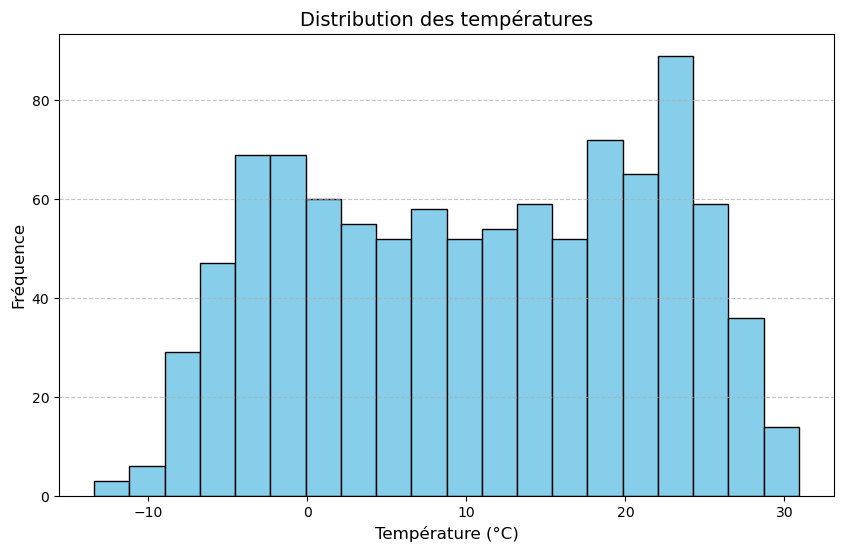

In [28]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(data["Temperature"], bins=20, color="skyblue", edgecolor="black")
plt.title("Distribution des températures", fontsize=14)
plt.xlabel("Température (°C)", fontsize=12)
plt.ylabel("Fréquence", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x="Temperature", y="Precipitation", hue="Season", palette="coolwarm")
plt.title("Relation entre Température et Précipitations", fontsize=14)
plt.xlabel("Température (°C)", fontsize=12)
plt.ylabel("Précipitations (mm)", fontsize=12)
plt.legend(title="Saison")
plt.grid(alpha=0.5)
plt.show()


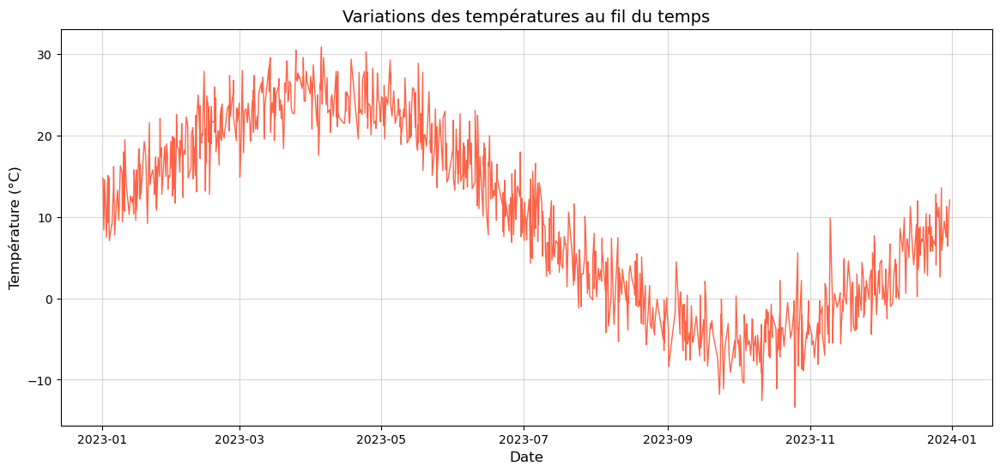

In [32]:
plt.figure(figsize=(14, 6))
plt.plot(data["Date"], data["Temperature"], color="tomato", linewidth=1)
plt.title("Variations des températures au fil du temps", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Température (°C)", fontsize=12)
plt.grid(alpha=0.5)
plt.show()


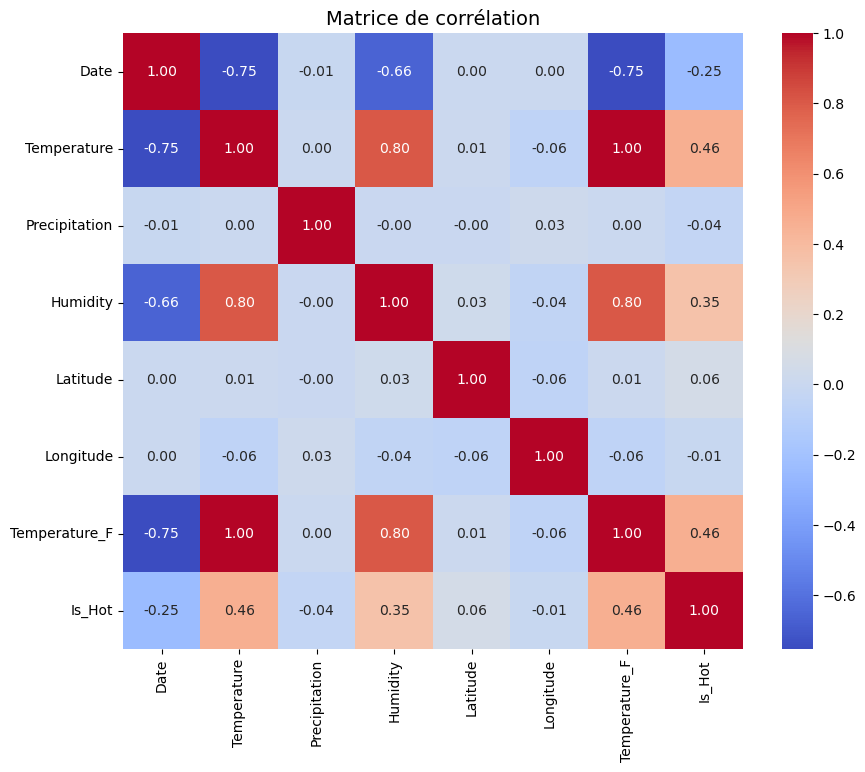

In [34]:
correlation_matrix = data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matrice de corrélation", fontsize=14)
plt.show()


In [36]:
data.to_csv("weather_data_transformed.csv", index=False)
print("Fichier transformé sauvegardé : weather_data_transformed.csv")


Fichier transformé sauvegardé : weather_data_transformed.csv


In [38]:
print(data.columns)


Index(['Date', 'Temperature', 'Precipitation', 'Humidity', 'Latitude',
       'Longitude', 'Temperature_F', 'Is_Hot'],
      dtype='object')


In [40]:
data["Temperature_Category"] = data["Temperature"].apply(
    lambda x: "Cold" if x < 10 else "Moderate" if x < 25 else "Hot"
)


In [56]:
print(data.head())


                  Date  Temperature  Precipitation  Humidity   Latitude  \
0  2023-01-01 12:00:00         14.8              0      33.1  30.828749   
1  2023-01-01 21:00:00          8.4              0      52.3  82.762384   
2  2023-01-02 04:00:00         14.6              0      56.7 -19.278880   
3  2023-01-03 00:00:00          7.5              0      60.7 -23.008814   
4  2023-01-03 10:00:00         14.1              0      53.7 -20.029257   

    Longitude  Temperature_F  Is_Hot Temperature_Category Day_of_Week  
0  -71.000954          58.64       0             Moderate      Sunday  
1  -19.613587          47.12       0                 Cold      Sunday  
2 -106.536820          58.28       0             Moderate      Monday  
3  -34.082870          45.50       0                 Cold     Tuesday  
4  174.475612          57.38       0             Moderate     Tuesday  


In [54]:
import pandas as pd

# Charger le dataset
data = pd.read_csv("weather_data_1000.csv")

# Ajouter une nouvelle colonne "Temperature_Category" en fonction de la température
data["Temperature_Category"] = data["Temperature"].apply(
    lambda x: "Cold" if x < 10 else "Moderate" if x < 25 else "Hot"
)

# Optionnel : Ajouter d'autres transformations
data["Day_of_Week"] = pd.to_datetime(data["Date"]).dt.day_name()

# Sauvegarder le fichier transformé
data.to_csv("weather_data_transformed.csv", index=False)
print("Fichier transformé sauvegardé avec succès dans 'weather_data_transformed.csv'.")


Fichier transformé sauvegardé avec succès dans 'weather_data_transformed.csv'.


In [58]:
import pandas as pd
import numpy as np

# Charger le dataset de base
data = pd.read_csv("weather_data_1000.csv")

# Convertir la colonne "Date" en format datetime
data["Date"] = pd.to_datetime(data["Date"])

# Étape 1 : Ajouter une colonne "Temperature_Category"
data["Temperature_Category"] = data["Temperature"].apply(
    lambda x: "Cold" if x < 10 else "Moderate" if x < 25 else "Hot"
)

# Étape 2 : Ajouter une colonne "Day_of_Week"
data["Day_of_Week"] = data["Date"].dt.day_name()

# Étape 3 : Ajouter une colonne binaire pour les jours avec des précipitations élevées
data["High_Precipitation"] = (data["Precipitation"] > 10).astype(int)

# Étape 4 : Calculer la température en Fahrenheit (si pas déjà présent)
data["Temperature_Fahrenheit"] = data["Temperature"] * 9/5 + 32

# Étape 5 : Ajout d'autres transformations (par exemple, humidité moyenne annuelle, etc.)
# Exemple : Calculer une humidité moyenne annuelle (ou autre transformation)
# On peut ignorer cette étape si elle n'est pas nécessaire

# Sauvegarder les données transformées dans un nouveau fichier CSV
data.to_csv("weather_data_transformed.csv", index=False)

# Afficher un aperçu des 5 premières lignes pour valider les changements
print(data.head())

print("Fichier transformé sauvegardé avec succès dans 'weather_data_transformed.csv'.")


                 Date  Temperature  Precipitation  Humidity   Latitude  \
0 2023-01-01 12:00:00         14.8              0      33.1  30.828749   
1 2023-01-01 21:00:00          8.4              0      52.3  82.762384   
2 2023-01-02 04:00:00         14.6              0      56.7 -19.278880   
3 2023-01-03 00:00:00          7.5              0      60.7 -23.008814   
4 2023-01-03 10:00:00         14.1              0      53.7 -20.029257   

    Longitude  Temperature_F  Is_Hot Temperature_Category Day_of_Week  \
0  -71.000954          58.64       0             Moderate      Sunday   
1  -19.613587          47.12       0                 Cold      Sunday   
2 -106.536820          58.28       0             Moderate      Monday   
3  -34.082870          45.50       0                 Cold     Tuesday   
4  174.475612          57.38       0             Moderate     Tuesday   

   High_Precipitation  Temperature_Fahrenheit  
0                   0                   58.64  
1                   

Résumé statistique des données :
       Temperature  Precipitation     Humidity     Latitude    Longitude  \
count  1000.000000    1000.000000  1000.000000  1000.000000  1000.000000   
mean     10.551300       1.840000    51.702600    -2.700336    -0.852300   
std      10.817936       4.368465    15.523131    51.069420   103.561562   
min     -13.400000       0.000000    30.000000   -89.994471  -179.918266   
25%       0.600000       0.000000    38.050000   -47.278395   -89.179462   
50%      10.950000       0.000000    51.350000    -3.121833    -6.150004   
75%      20.325000       0.000000    64.425000    40.446042    90.473408   
max      30.900000      20.000000    98.800000    89.920387   179.565457   

       Temperature_F       Is_Hot  
count    1000.000000  1000.000000  
mean       50.992340     0.085000  
std        19.472285     0.279021  
min         7.880000     0.000000  
25%        33.080000     0.000000  
50%        51.710000     0.000000  
75%        68.585000     0.000

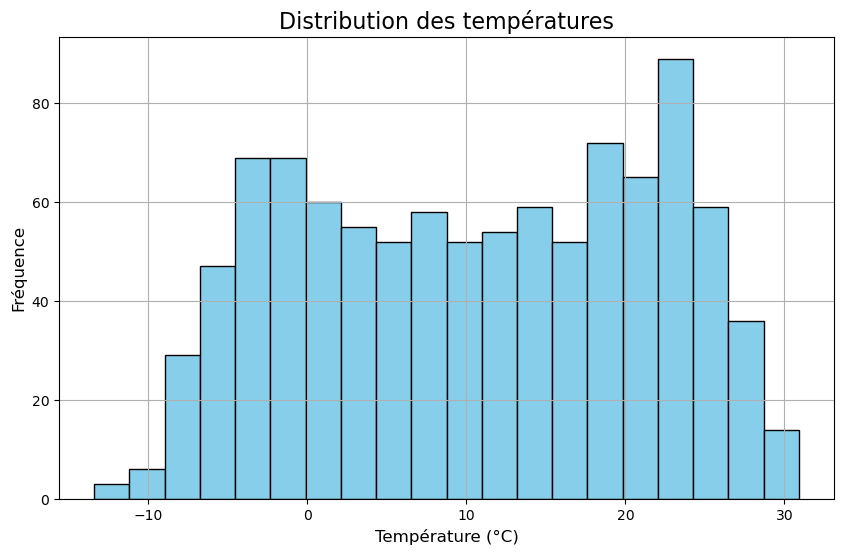

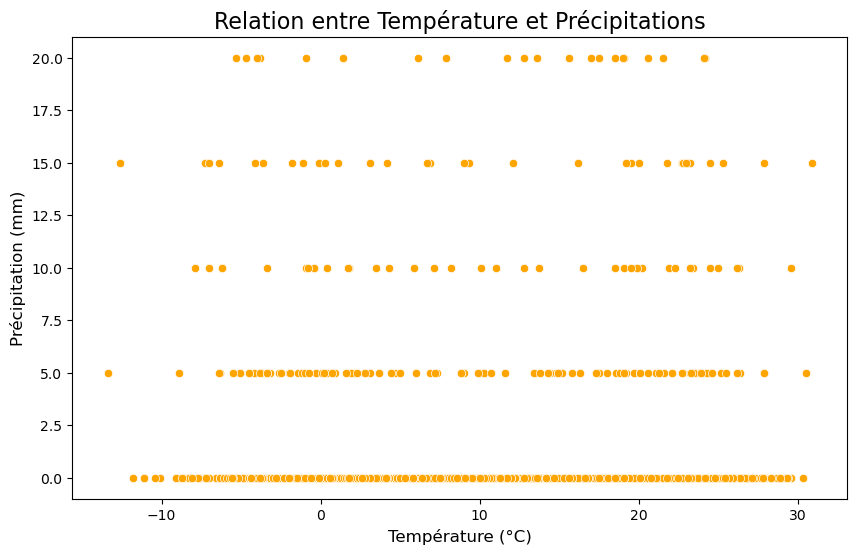

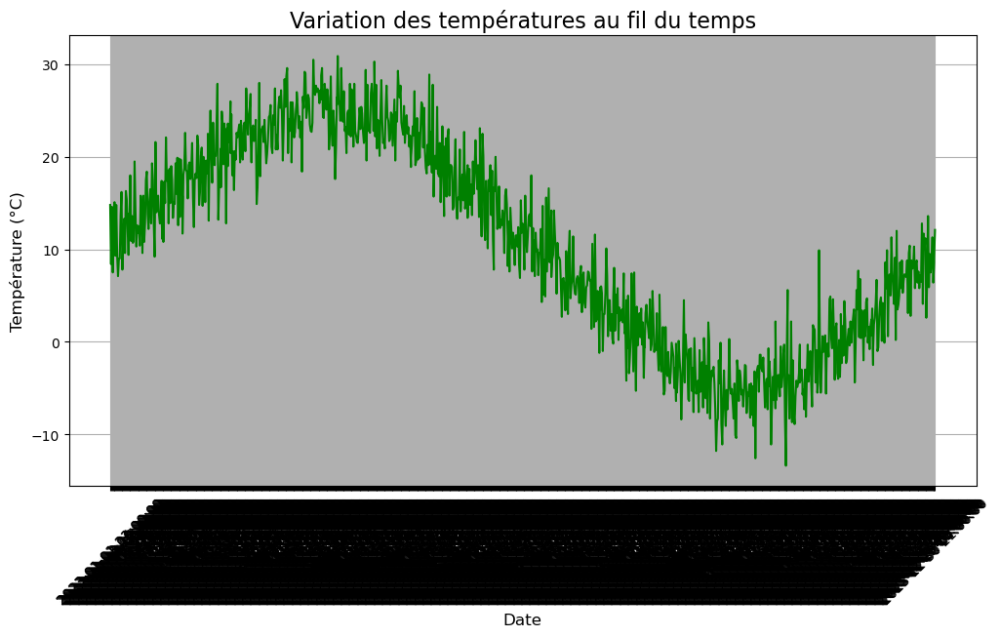

KeyError: "['Temperature_Fahrenheit'] not in index"

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Charger le dataset de base
data = pd.read_csv("weather_data_1000.csv")
# Étape 5 : Résumé statistique des données
print("Résumé statistique des données :")
print(data.describe())

# Étape 6 : Visualisation - Histogramme des températures
plt.figure(figsize=(10, 6))
plt.hist(data["Temperature"], bins=20, color='skyblue', edgecolor='black')
plt.title("Distribution des températures", fontsize=16)
plt.xlabel("Température (°C)", fontsize=12)
plt.ylabel("Fréquence", fontsize=12)
plt.grid(True)
plt.show()

# Étape 7 : Exploration des relations avec Seaborn - Températures vs Précipitations
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x="Temperature", y="Precipitation", color='orange')
plt.title("Relation entre Température et Précipitations", fontsize=16)
plt.xlabel("Température (°C)", fontsize=12)
plt.ylabel("Précipitation (mm)", fontsize=12)
plt.show()

# Étape 8 : Analyse temporelle des températures
plt.figure(figsize=(12, 6))
plt.plot(data["Date"], data["Temperature"], color='green', label='Température (°C)')
plt.title("Variation des températures au fil du temps", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Température (°C)", fontsize=12)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

# Étape 9 : Calculer la matrice de corrélation des colonnes numériques
correlation_matrix = data[["Temperature", "Precipitation", "Humidity", "Latitude", "Longitude", "Temperature_Fahrenheit", "Is_Hot"]].corr()

# Affichage de la heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Matrice de corrélation", fontsize=16)
plt.show()

# Étape 10 : Exportation des données transformées
data.to_csv("weather_data_transformed.csv", index=False)
print("Fichier transformé sauvegardé avec succès dans 'weather_data_transformed.csv'.")

Résumé statistique des données :
                             Date  Temperature  Precipitation     Humidity  \
count                        1000  1000.000000    1000.000000  1000.000000   
mean   2023-06-27 17:34:19.200000    10.551300       1.840000    51.702600   
min           2023-01-01 12:00:00   -13.400000       0.000000    30.000000   
25%           2023-03-26 00:00:00     0.600000       0.000000    38.050000   
50%           2023-06-26 09:30:00    10.950000       0.000000    51.350000   
75%           2023-09-28 06:00:00    20.325000       0.000000    64.425000   
max           2023-12-30 21:00:00    30.900000      20.000000    98.800000   
std                           NaN    10.817936       4.368465    15.523131   

          Latitude    Longitude  Temperature_F       Is_Hot  \
count  1000.000000  1000.000000    1000.000000  1000.000000   
mean     -2.700336    -0.852300      50.992340     0.085000   
min     -89.994471  -179.918266       7.880000     0.000000   
25%     -47.

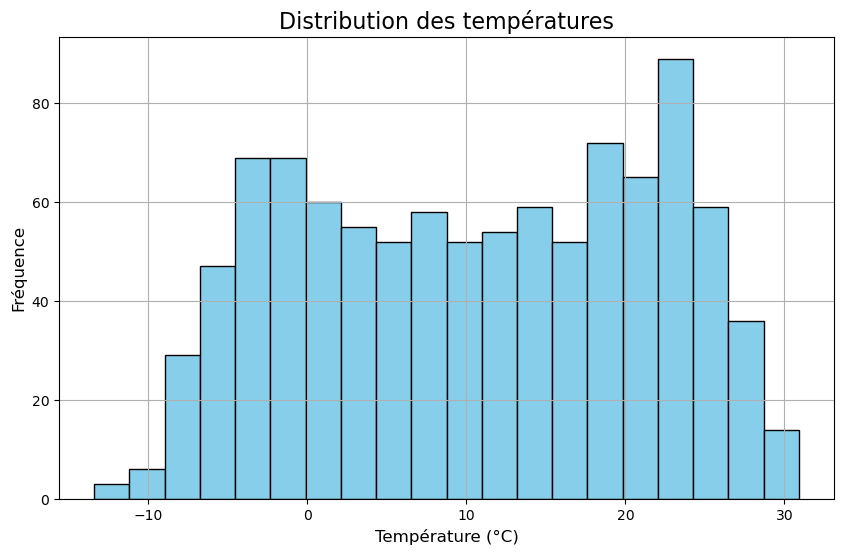

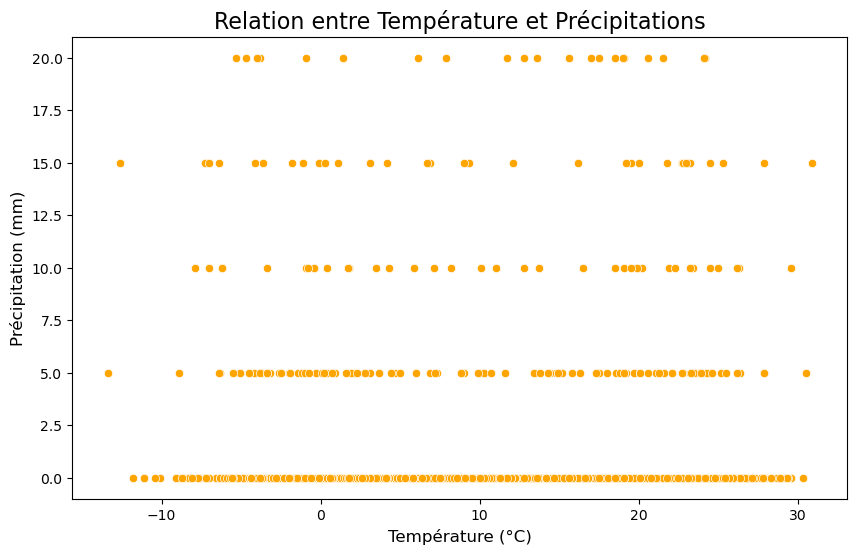

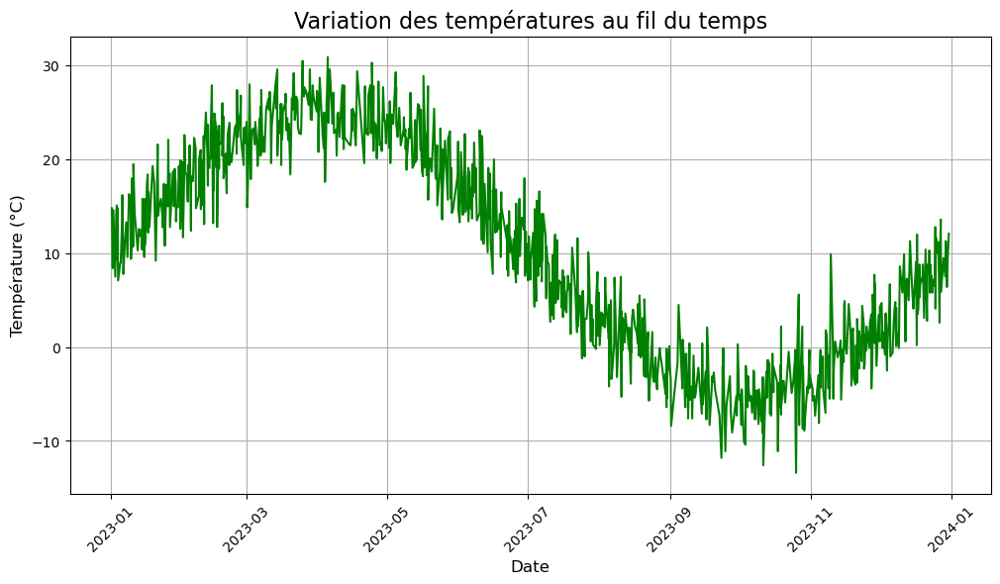

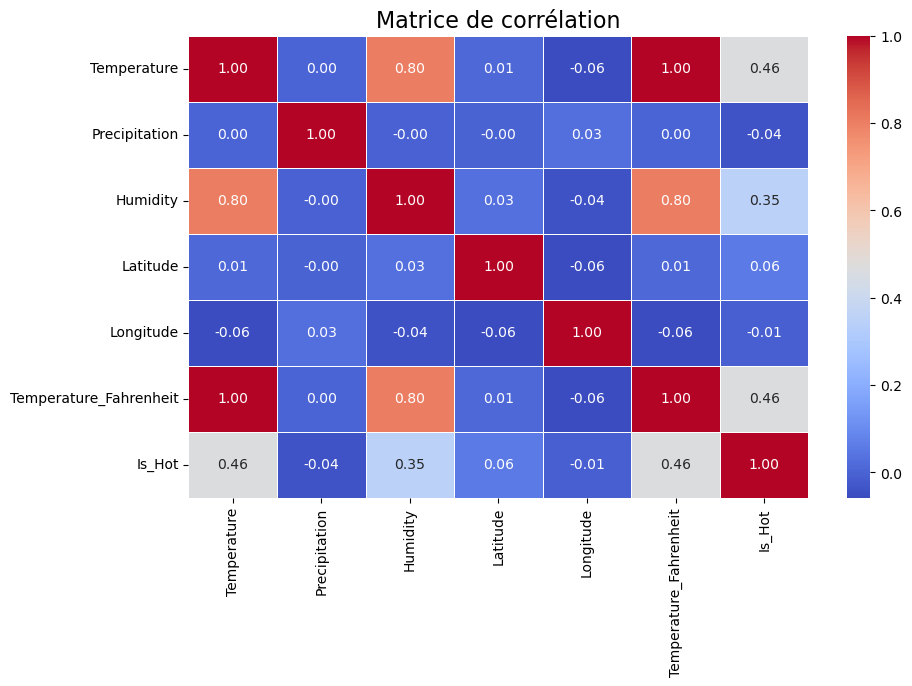

Fichier transformé sauvegardé avec succès dans 'weather_data_transformed.csv'.


In [70]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Charger le dataset de base
data = pd.read_csv("weather_data_1000.csv")

# Convertir la colonne "Date" en format datetime
data["Date"] = pd.to_datetime(data["Date"])

# Étape 1 : Ajouter une colonne "Temperature_Category"
data["Temperature_Category"] = data["Temperature"].apply(
    lambda x: "Cold" if x < 10 else "Moderate" if x < 25 else "Hot"
)

# Étape 2 : Ajouter une colonne "Day_of_Week"
data["Day_of_Week"] = data["Date"].dt.day_name()

# Étape 3 : Ajouter une colonne binaire pour les jours avec des précipitations élevées
data["High_Precipitation"] = (data["Precipitation"] > 10).astype(int)

# Étape 4 : Calculer la température en Fahrenheit (si pas déjà présent)
data["Temperature_Fahrenheit"] = data["Temperature"] * 9/5 + 32

# Étape 5 : Résumé statistique des données
print("Résumé statistique des données :")
print(data.describe())

# Étape 6 : Visualisation - Histogramme des températures
plt.figure(figsize=(10, 6))
plt.hist(data["Temperature"], bins=20, color='skyblue', edgecolor='black')
plt.title("Distribution des températures", fontsize=16)
plt.xlabel("Température (°C)", fontsize=12)
plt.ylabel("Fréquence", fontsize=12)
plt.grid(True)
plt.show()

# Étape 7 : Exploration des relations avec Seaborn - Températures vs Précipitations
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x="Temperature", y="Precipitation", color='orange')
plt.title("Relation entre Température et Précipitations", fontsize=16)
plt.xlabel("Température (°C)", fontsize=12)
plt.ylabel("Précipitation (mm)", fontsize=12)
plt.show()

# Étape 8 : Analyse temporelle des températures
plt.figure(figsize=(12, 6))
plt.plot(data["Date"], data["Temperature"], color='green', label='Température (°C)')
plt.title("Variation des températures au fil du temps", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Température (°C)", fontsize=12)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

# Étape 9 : Calculer la matrice de corrélation des colonnes numériques
correlation_matrix = data[["Temperature", "Precipitation", "Humidity", "Latitude", "Longitude", "Temperature_Fahrenheit", "Is_Hot"]].corr()

# Affichage de la heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Matrice de corrélation", fontsize=16)
plt.show()

# Étape 10 : Exportation des données transformées
data.to_csv("weather_data_transformed.csv", index=False)
print("Fichier transformé sauvegardé avec succès dans 'weather_data_transformed.csv'.")


Shape du dataset :  (1000, 8)
Types de données : 
Date              object
Temperature      float64
Precipitation      int64
Humidity         float64
Latitude         float64
Longitude        float64
Temperature_F    float64
Is_Hot             int64
dtype: object

Résumé statistique des données : 
       Temperature  Precipitation     Humidity     Latitude    Longitude  \
count  1000.000000    1000.000000  1000.000000  1000.000000  1000.000000   
mean     10.551300       1.840000    51.702600    -2.700336    -0.852300   
std      10.817936       4.368465    15.523131    51.069420   103.561562   
min     -13.400000       0.000000    30.000000   -89.994471  -179.918266   
25%       0.600000       0.000000    38.050000   -47.278395   -89.179462   
50%      10.950000       0.000000    51.350000    -3.121833    -6.150004   
75%      20.325000       0.000000    64.425000    40.446042    90.473408   
max      30.900000      20.000000    98.800000    89.920387   179.565457   

       Temperatu

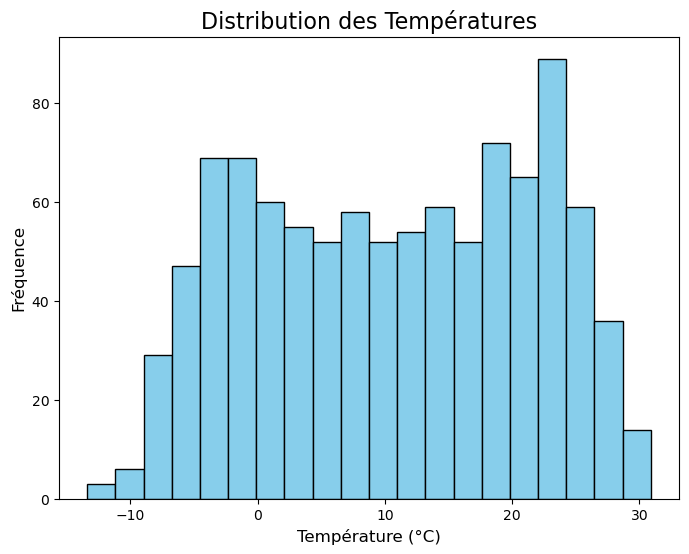

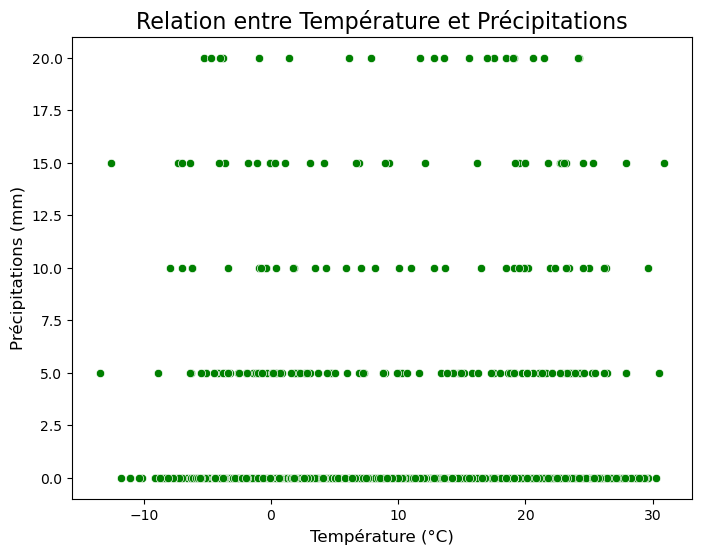

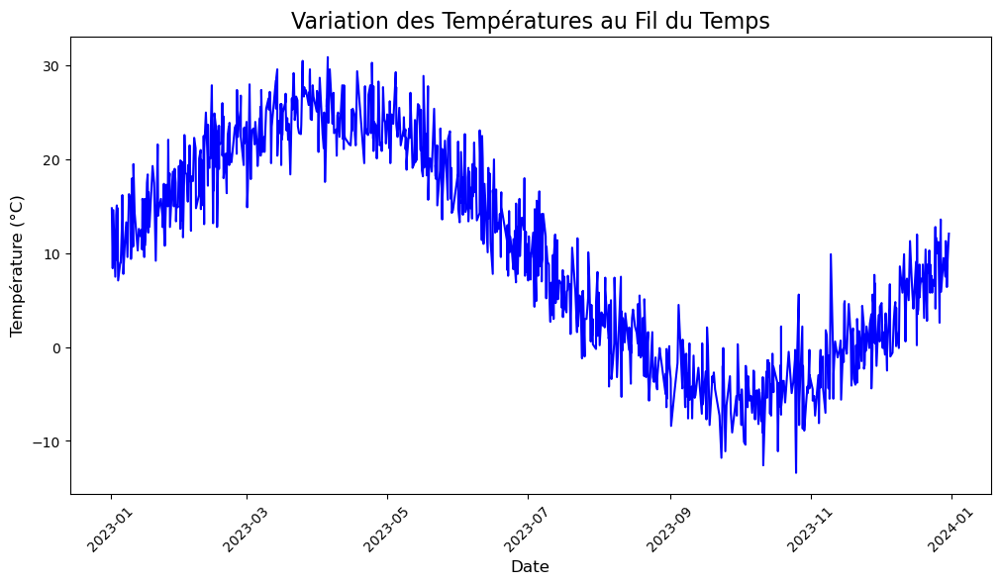

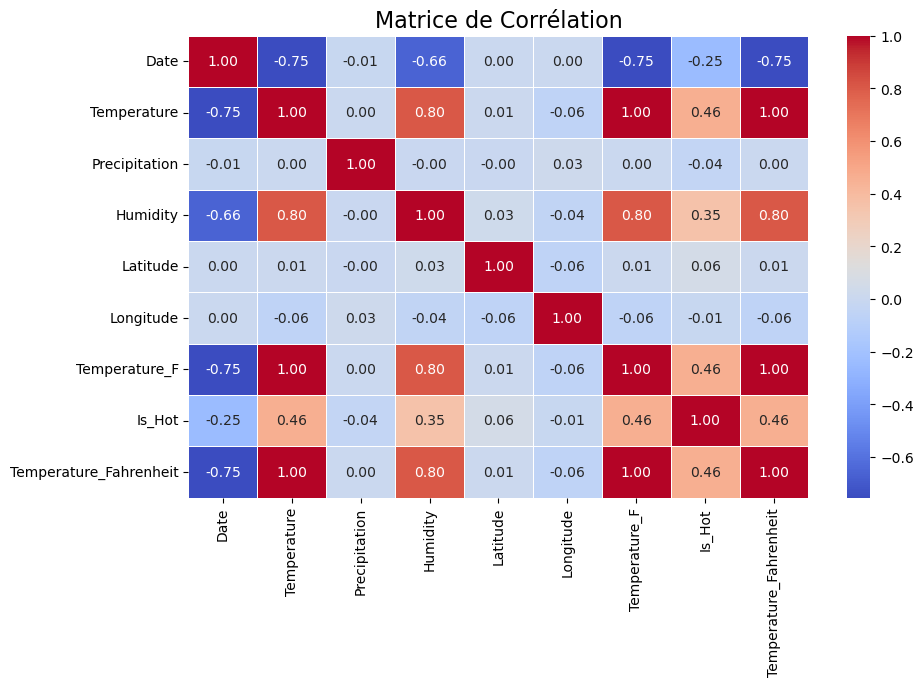


Fichier transformé sauvegardé sous 'weather_data_transformed.csv'.


In [68]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Étape 1 : Chargement des données dans Python avec pandas
data = pd.read_csv('weather_data_1000.csv')

# Vérifier le nombre de lignes et de colonnes
print("Shape du dataset : ", data.shape)

# Vérifier les types de données de chaque colonne
print("Types de données : ")
print(data.dtypes)

# Étape 2 : Résumé statistique des données
print("\nRésumé statistique des données : ")
print(data.describe())

# Question : minimum et maximum des températures
min_temp = data['Temperature'].min()
max_temp = data['Temperature'].max()
print(f"\nTempérature minimum: {min_temp}°C")
print(f"Température maximum: {max_temp}°C")

# Étape 3 : Nettoyage des données (gestion des valeurs manquantes)
print("\nValeurs manquantes par colonne :")
print(data.isnull().sum())

# Remplir les valeurs manquantes de la température avec la moyenne
data['Temperature'] = data['Temperature'].fillna(data['Temperature'].mean())

# Étape 4 : Création de colonnes dérivées
data['Temperature_Fahrenheit'] = data['Temperature'] * 9/5 + 32

# Étape 5 : Filtrage des données
hot_days = data[data['Temperature'] > 30]
print("\nJours où la température dépasse 30°C :")
print(hot_days)

# Étape 6 : Visualisation des données avec Matplotlib
plt.figure(figsize=(8, 6))
plt.hist(data['Temperature'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution des Températures', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Fréquence', fontsize=12)
plt.show()

# Étape 7 : Exploration des relations avec Seaborn
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='Temperature', y='Precipitation', color='green')
plt.title('Relation entre Température et Précipitations', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Précipitations (mm)', fontsize=12)
plt.show()

# Étape 8 : Détection des tendances temporelles
data['Date'] = pd.to_datetime(data['Date'])

plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Temperature'], color='blue')
plt.title('Variation des Températures au Fil du Temps', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Température (°C)', fontsize=12)
plt.xticks(rotation=45)
plt.show()

# Étape 9 : Résumé des corrélations
correlation_matrix = data.corr()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matrice de Corrélation', fontsize=16)
plt.show()

# Étape 10 : Exportation des données transformées
data.to_csv('weather_data_transformed.csv', index=False)
print("\nFichier transformé sauvegardé sous 'weather_data_transformed.csv'.")


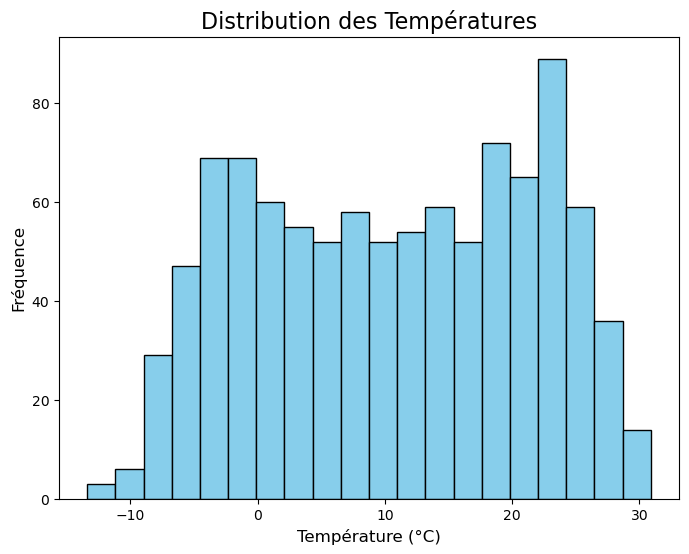

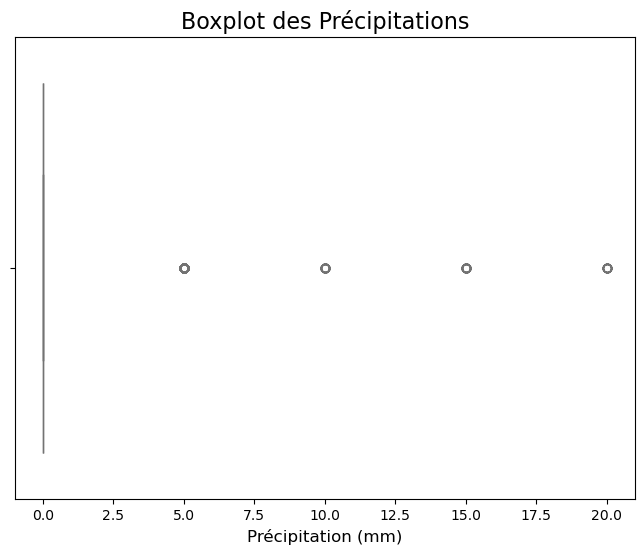

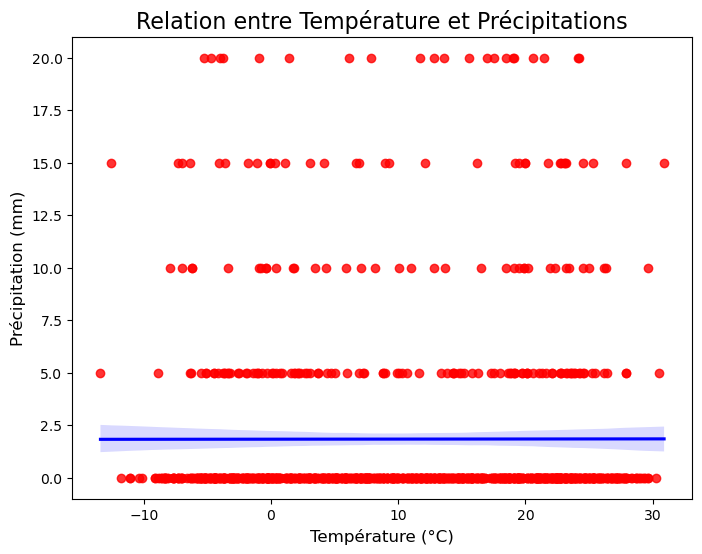

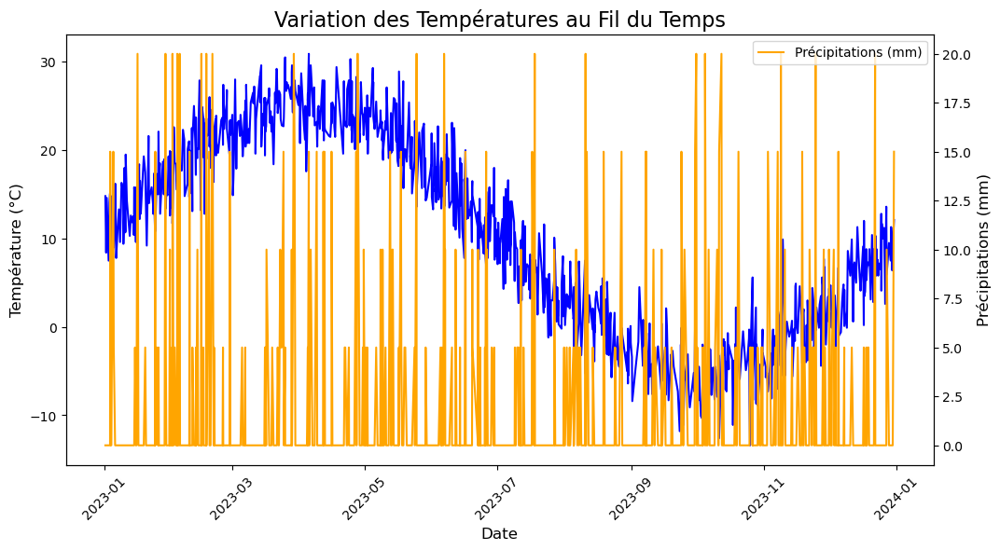

ValueError: could not convert string to float: 'Moderate'

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Charger le dataset nettoyé
data = pd.read_csv('weather_data_transformed.csv')

# Étape 1 : Histogramme des températures
plt.figure(figsize=(8, 6))
plt.hist(data['Temperature'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution des Températures', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Fréquence', fontsize=12)
plt.show()

# Étape 2 : Boxplot des précipitations
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['Precipitation'], color='lightgreen')
plt.title('Boxplot des Précipitations', fontsize=16)
plt.xlabel('Précipitation (mm)', fontsize=12)
plt.show()

# Étape 3 : Relation entre température et précipitations
plt.figure(figsize=(8, 6))
sns.regplot(x='Temperature', y='Precipitation', data=data, scatter_kws={'color': 'red'}, line_kws={'color': 'blue'})
plt.title('Relation entre Température et Précipitations', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Précipitation (mm)', fontsize=12)
plt.show()

# Étape 4 : Analyse temporelle des températures
# Convertir la colonne 'Date' en datetime
data['Date'] = pd.to_datetime(data['Date'])

plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Temperature'], color='blue', label='Température (°C)')
plt.title('Variation des Températures au Fil du Temps', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Température (°C)', fontsize=12)
plt.xticks(rotation=45)

# Ajouter un graphique secondaire pour les précipitations
plt.twinx()
plt.plot(data['Date'], data['Precipitation'], color='orange', label='Précipitations (mm)')
plt.ylabel('Précipitations (mm)', fontsize=12)

plt.legend()
plt.show()

# Étape 5 : Heatmap des corrélations
correlation_matrix = data.corr()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matrice de Corrélation', fontsize=16)
plt.show()

# Étape 6 : Graphiques interactifs avec Plotly
# Graphique interactif montrant les variations des températures en fonction des dates
fig = px.line(data, x='Date', y='Temperature', title='Variation des Températures au Fil du Temps')
fig.update_xaxes(title='Date')
fig.update_yaxes(title='Température (°C)')
fig.show()





Date                      datetime64[ns]
Temperature                      float64
Precipitation                      int64
Humidity                         float64
Latitude                         float64
Longitude                        float64
Temperature_F                    float64
Is_Hot                             int64
Temperature_Category              object
Day_of_Week                       object
High_Precipitation                 int64
Temperature_Fahrenheit           float64
dtype: object


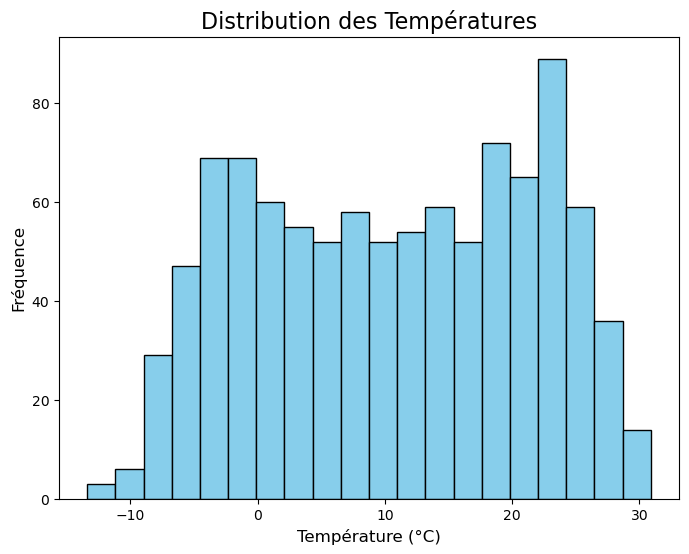

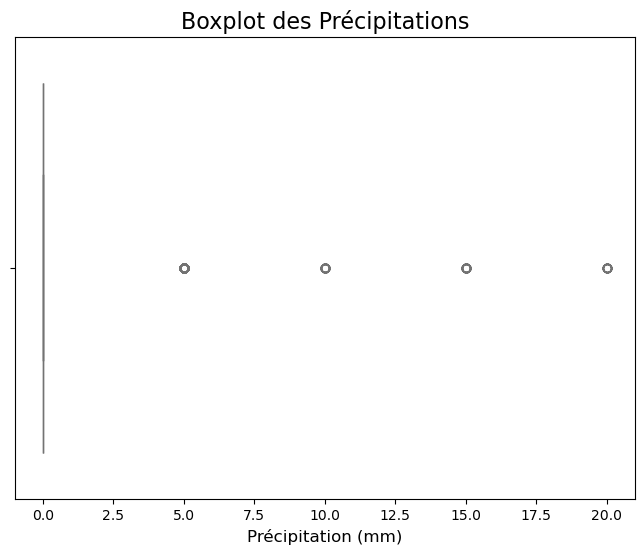

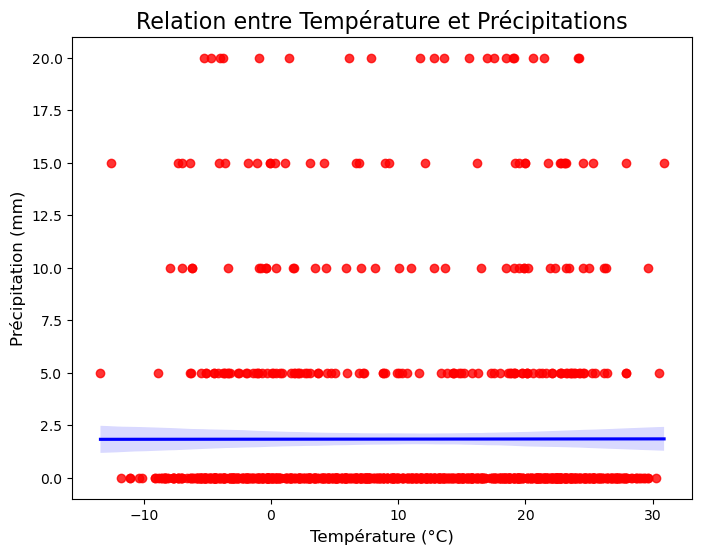

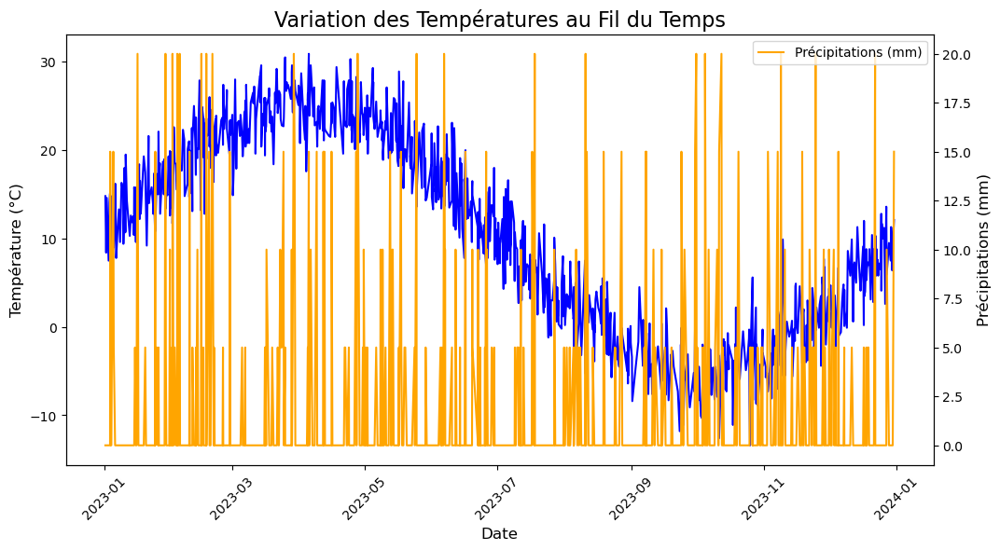

ValueError: could not convert string to float: 'Sunday'

In [76]:
# Vérification des types de données
print(data.dtypes)

# Si des colonnes catégorielles comme 'Temperature_Category' existent, les retirer
if 'Temperature_Category' in data.columns:
    data = data.drop(columns=['Temperature_Category'])

# Étape 1 : Histogramme des températures
plt.figure(figsize=(8, 6))
plt.hist(data['Temperature'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution des Températures', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Fréquence', fontsize=12)
plt.show()

# Étape 2 : Boxplot des précipitations
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['Precipitation'], color='lightgreen')
plt.title('Boxplot des Précipitations', fontsize=16)
plt.xlabel('Précipitation (mm)', fontsize=12)
plt.show()

# Étape 3 : Relation entre température et précipitations
plt.figure(figsize=(8, 6))
sns.regplot(x='Temperature', y='Precipitation', data=data, scatter_kws={'color': 'red'}, line_kws={'color': 'blue'})
plt.title('Relation entre Température et Précipitations', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Précipitation (mm)', fontsize=12)
plt.show()

# Étape 4 : Analyse temporelle des températures
# Convertir la colonne 'Date' en datetime si ce n'est pas déjà fait
data['Date'] = pd.to_datetime(data['Date'])

plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Temperature'], color='blue', label='Température (°C)')
plt.title('Variation des Températures au Fil du Temps', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Température (°C)', fontsize=12)
plt.xticks(rotation=45)

# Ajouter un graphique secondaire pour les précipitations
plt.twinx()
plt.plot(data['Date'], data['Precipitation'], color='orange', label='Précipitations (mm)')
plt.ylabel('Précipitations (mm)', fontsize=12)

plt.legend()
plt.show()

# Étape 5 : Heatmap des corrélations
correlation_matrix = data.corr()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matrice de Corrélation', fontsize=16)
plt.show()

# Étape 6 : Graphiques interactifs avec Plotly
# Graphique interactif montrant les variations des températures en fonction des dates
fig = px.line(data, x='Date', y='Temperature', title='Variation des Températures au Fil du Temps')
fig.update_xaxes(title='Date')
fig.update_yaxes(title='Température (°C)')
fig.show()



In [78]:
print(data.dtypes)


Date                      datetime64[ns]
Temperature                      float64
Precipitation                      int64
Humidity                         float64
Latitude                         float64
Longitude                        float64
Temperature_F                    float64
Is_Hot                             int64
Day_of_Week                       object
High_Precipitation                 int64
Temperature_Fahrenheit           float64
dtype: object


In [80]:

# Si la colonne 'Day_of_Week' existe
data = pd.get_dummies(data, columns=['Day_of_Week'])



Date                       object
Temperature               float64
Precipitation               int64
Humidity                  float64
Latitude                  float64
Longitude                 float64
Temperature_F             float64
Is_Hot                      int64
Temperature_Category       object
Day_of_Week                object
High_Precipitation          int64
Temperature_Fahrenheit    float64
dtype: object


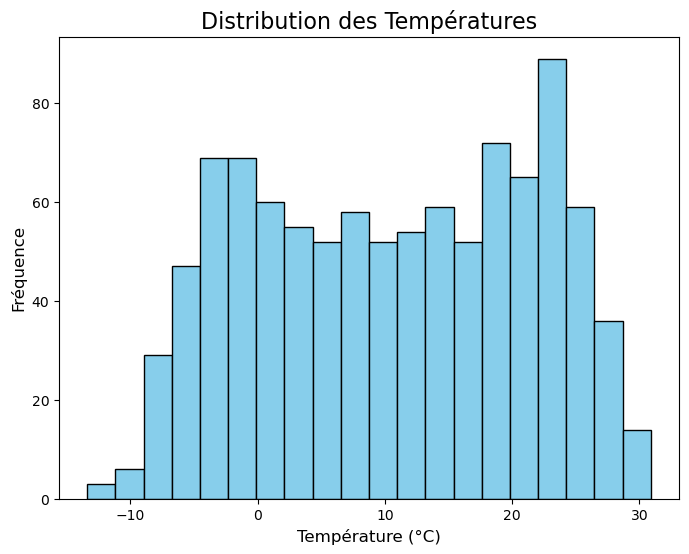

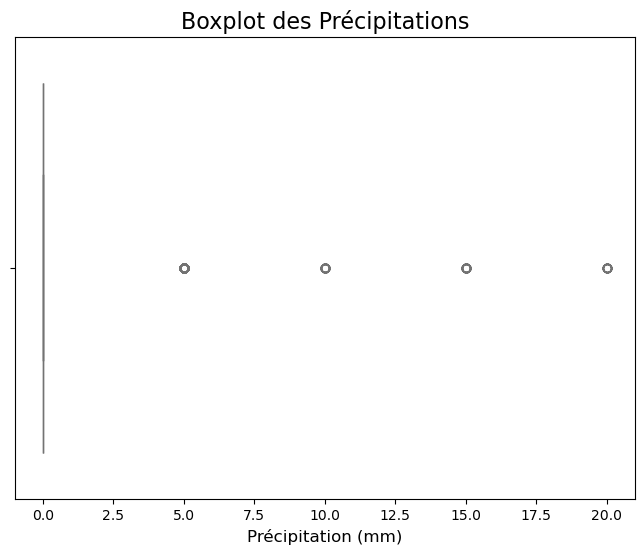

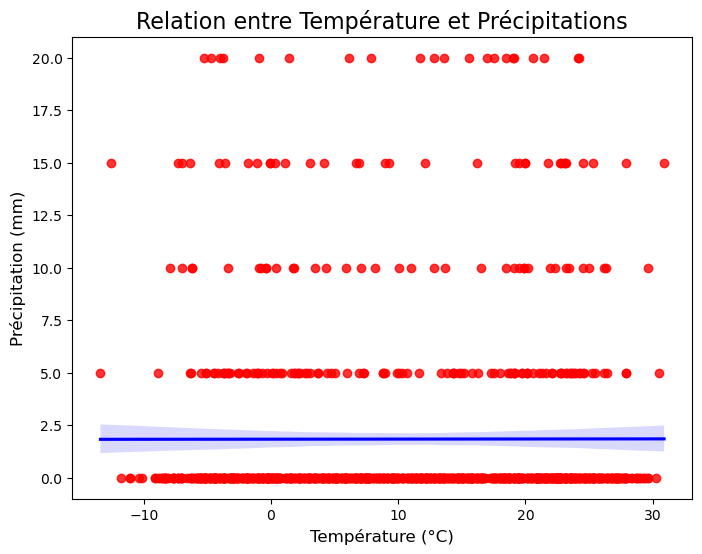

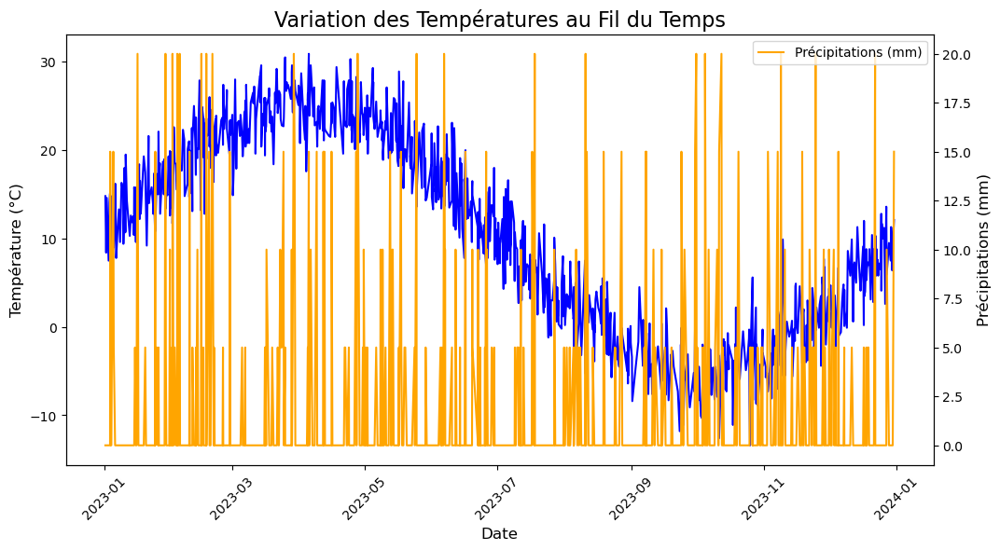

ValueError: could not convert string to float: 'Moderate'

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Charger le dataset nettoyé
data = pd.read_csv('weather_data_transformed.csv')

# Vérifier les types de données pour détecter les chaînes de caractères
print(data.dtypes)

# Si la colonne 'Day_of_Week' existe et contient des jours de la semaine, l'encoder (Option 1)
if 'Day_of_Week' in data.columns:
    data['Day_of_Week'] = data['Day_of_Week'].map({
        'Monday': 0, 'Tuesday': 1, 'Wednesday': 2,
        'Thursday': 3, 'Friday': 4, 'Saturday': 5, 'Sunday': 6
    })

# Étape 1 : Histogramme des températures
plt.figure(figsize=(8, 6))
plt.hist(data['Temperature'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution des Températures', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Fréquence', fontsize=12)
plt.show()

# Étape 2 : Boxplot des précipitations
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['Precipitation'], color='lightgreen')
plt.title('Boxplot des Précipitations', fontsize=16)
plt.xlabel('Précipitation (mm)', fontsize=12)
plt.show()

# Étape 3 : Relation entre température et précipitations
plt.figure(figsize=(8, 6))
sns.regplot(x='Temperature', y='Precipitation', data=data, scatter_kws={'color': 'red'}, line_kws={'color': 'blue'})
plt.title('Relation entre Température et Précipitations', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Précipitation (mm)', fontsize=12)
plt.show()

# Étape 4 : Analyse temporelle des températures
# Convertir la colonne 'Date' en datetime
data['Date'] = pd.to_datetime(data['Date'])

plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Temperature'], color='blue', label='Température (°C)')
plt.title('Variation des Températures au Fil du Temps', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Température (°C)', fontsize=12)
plt.xticks(rotation=45)

# Ajouter un graphique secondaire pour les précipitations
plt.twinx()
plt.plot(data['Date'], data['Precipitation'], color='orange', label='Précipitations (mm)')
plt.ylabel('Précipitations (mm)', fontsize=12)

plt.legend()
plt.show()

# Étape 5 : Heatmap des corrélations
correlation_matrix = data.corr()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matrice de Corrélation', fontsize=16)
plt.show()

# Étape 6 : Graphiques interactifs avec Plotly
# Graphique interactif montrant les variations des températures en fonction des dates
fig = px.line(data, x='Date', y='Temperature', title='Variation des Températures au Fil du Temps')
fig.update_xaxes(title='Date')
fig.update_yaxes(title='Température (°C)')
fig.show()


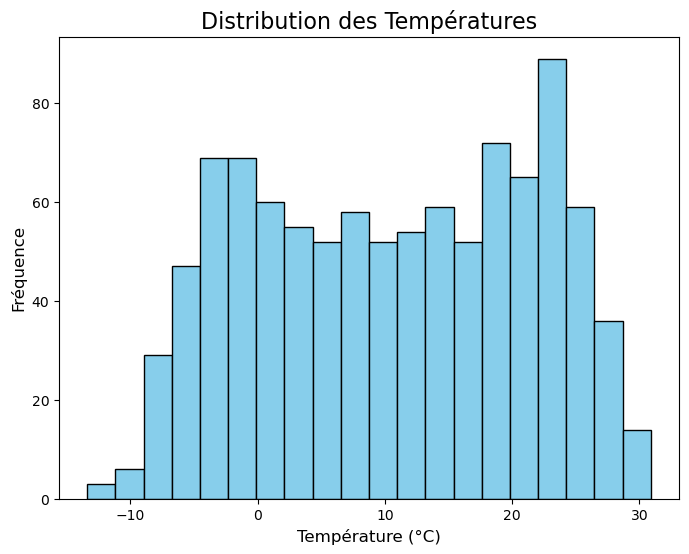

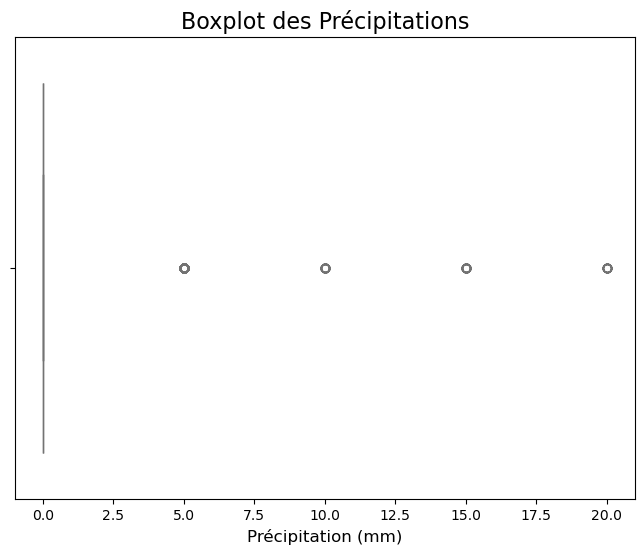

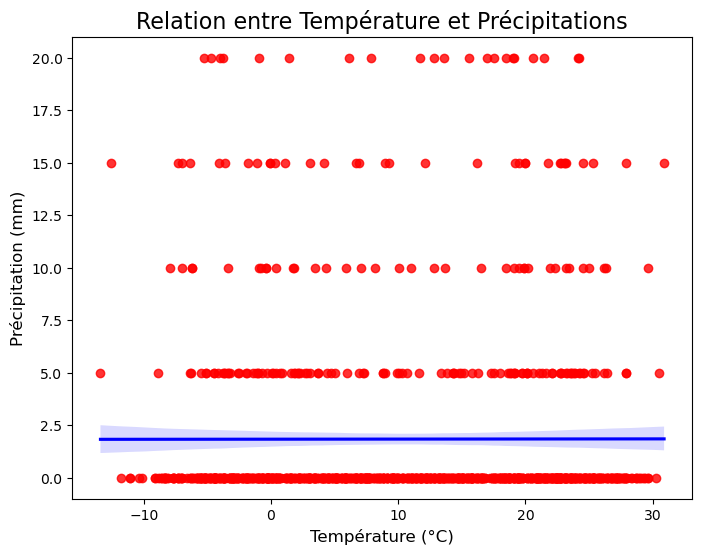

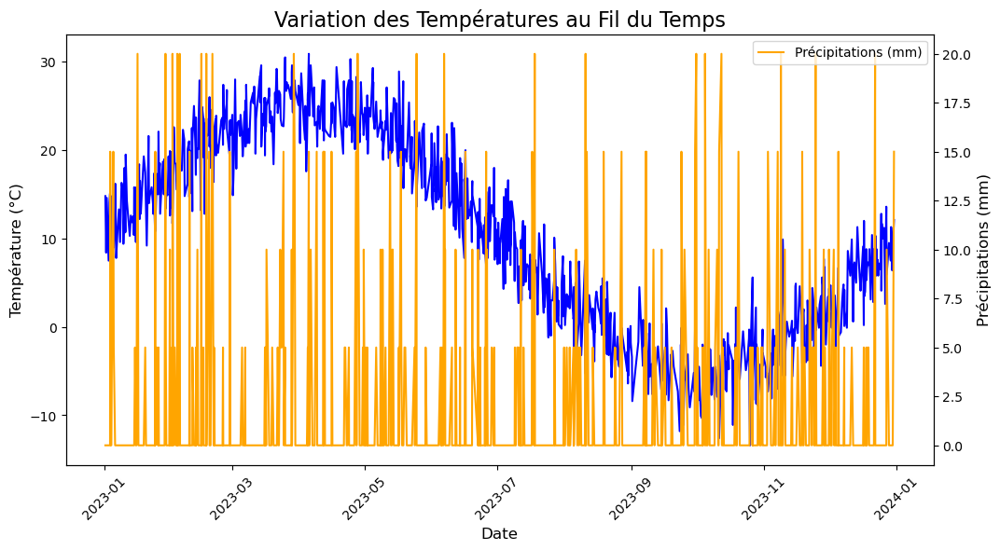

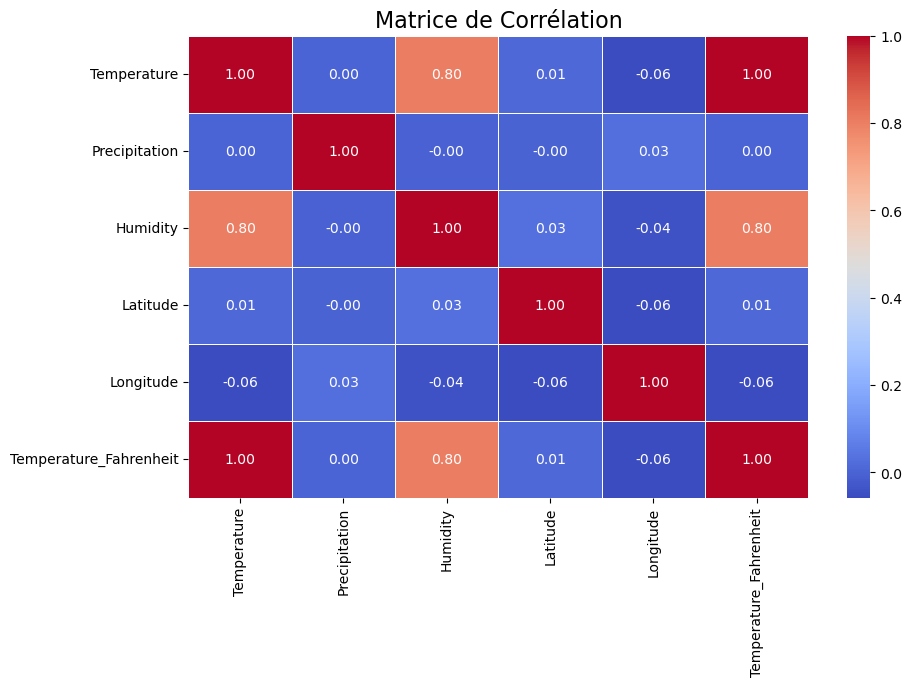

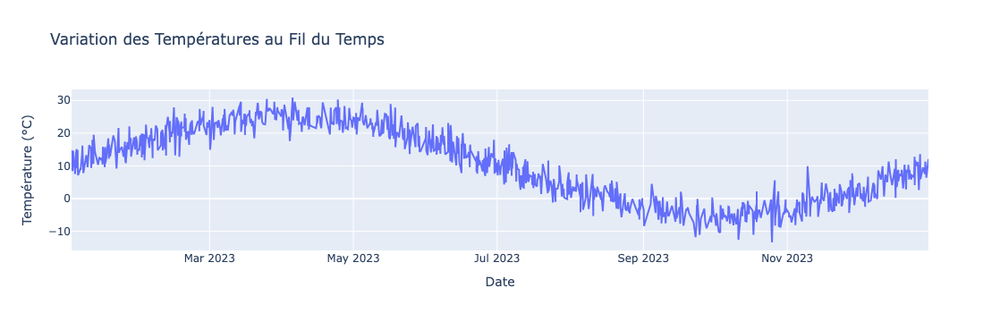

In [84]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Charger le dataset nettoyé
data = pd.read_csv('weather_data_transformed.csv')

# Étape 1 : Histogramme des températures
plt.figure(figsize=(8, 6))
plt.hist(data['Temperature'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution des Températures', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Fréquence', fontsize=12)
plt.show()

# Étape 2 : Boxplot des précipitations
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['Precipitation'], color='lightgreen')
plt.title('Boxplot des Précipitations', fontsize=16)
plt.xlabel('Précipitation (mm)', fontsize=12)
plt.show()

# Étape 3 : Relation entre température et précipitations
plt.figure(figsize=(8, 6))
sns.regplot(x='Temperature', y='Precipitation', data=data, scatter_kws={'color': 'red'}, line_kws={'color': 'blue'})
plt.title('Relation entre Température et Précipitations', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Précipitation (mm)', fontsize=12)
plt.show()

# Étape 4 : Analyse temporelle des températures
# Convertir la colonne 'Date' en datetime
data['Date'] = pd.to_datetime(data['Date'])

plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Temperature'], color='blue', label='Température (°C)')
plt.title('Variation des Températures au Fil du Temps', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Température (°C)', fontsize=12)
plt.xticks(rotation=45)

# Ajouter un graphique secondaire pour les précipitations
plt.twinx()
plt.plot(data['Date'], data['Precipitation'], color='orange', label='Précipitations (mm)')
plt.ylabel('Précipitations (mm)', fontsize=12)

plt.legend()
plt.show()

# Étape 5 : Heatmap des corrélations
correlation_matrix = data[['Temperature', 'Precipitation', 'Humidity', 'Latitude', 'Longitude', 'Temperature_Fahrenheit']].corr()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matrice de Corrélation', fontsize=16)
plt.show()

# Étape 6 : Graphiques interactifs avec Plotly
# Graphique interactif montrant les variations des températures en fonction des dates
fig = px.line(data, x='Date', y='Temperature', title='Variation des Températures au Fil du Temps')
fig.update_xaxes(title='Date')
fig.update_yaxes(title='Température (°C)')
fig.show()


In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Étape 1 : Chargement des données et préparation pour la modélisation
data = pd.read_csv('weather_data_transformed.csv')

# Sélection des features (X) et de la target (y)
X = data[['Precipitation', 'Humidity', 'Latitude', 'Longitude']]  # Features
y = data['Temperature']  # Target

# Diviser en jeu d'entraînement (80%) et jeu de test (20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Étape 2 : Normalisation des données avec StandardScaler
scaler = StandardScaler()

# Appliquer le scaler sur les données d'entraînement et de test
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Étape 3 : Création et entraînement du modèle
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Prédictions sur les données de test
y_pred = model.predict(X_test_scaled)

# Étape 4 : Évaluation des performances
# Calcul du RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# Calcul du R²
r2 = r2_score(y_test, y_pred)

# Affichage des résultats
print(f'Performance du modèle :')
print(f'RMSE : {rmse:.2f}')
print(f'R² : {r2:.2f}')


Performance du modèle :
RMSE : 6.27
R² : 0.68


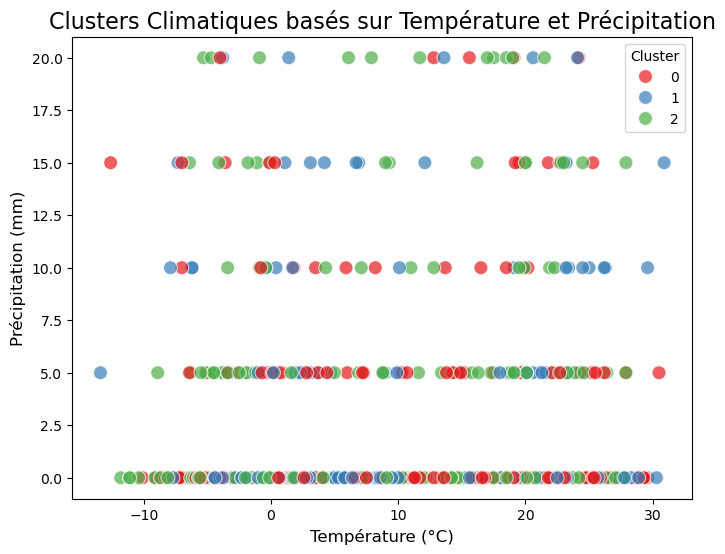

In [7]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Étape 1 : Préparation des données
data = pd.read_csv('weather_data_transformed.csv')

# Sélectionner les colonnes pertinentes pour le clustering
# Par exemple, Temperature, Precipitation, Humidity, Latitude et Longitude
X = data[['Temperature', 'Precipitation', 'Humidity', 'Latitude', 'Longitude']]

# Étape 2 : Construction du modèle K-Means
# Appliquer K-Means avec 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
data['Cluster'] = kmeans.fit_predict(X)  # Ajouter les résultats des clusters au DataFrame

# Étape 3 : Visualisation des clusters
# Nous allons utiliser la température et les précipitations pour la visualisation
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='Temperature', y='Precipitation', hue='Cluster', palette='Set1', s=100, alpha=0.7)
plt.title('Clusters Climatiques basés sur Température et Précipitation', fontsize=16)
plt.xlabel('Température (°C)', fontsize=12)
plt.ylabel('Précipitation (mm)', fontsize=12)
plt.legend(title='Cluster', fontsize=10)
plt.show()


In [7]:
import pandas as pd

# Charger les données
data = pd.read_csv('weather_data_transformed.csv')

# Convertir la colonne 'Date' en format datetime
data['Date'] = pd.to_datetime(data['Date'])

# Extraire le mois pour chaque entrée
data['Month'] = data['Date'].dt.month

# Calculer les moyennes et totaux par mois
monthly_data = data.groupby('Month').agg({
    'Temperature': 'mean',    # Température moyenne
    'Precipitation': 'sum',   # Précipitations totales
    'Humidity': 'mean'        # Humidité moyenne
}).reset_index()

# Renommer les colonnes pour plus de clarté
monthly_data.rename(columns={
    'Temperature': 'Avg_Temperature',
    'Precipitation': 'Total_Precipitation',
    'Humidity': 'Avg_Humidity'
}, inplace=True)

# Afficher les données mensuelles regroupées
print(monthly_data)


    Month  Avg_Temperature  Total_Precipitation  Avg_Humidity
0       1        14.002381                  130     56.803571
1       2        20.215789                  235     63.349474
2       3        24.419767                  130     67.952326
3       4        24.206667                  185     70.170667
4       5        21.420000                  160     65.916250
5       6        14.257447                  165     55.691489
6       7         6.655882                   95     45.556863
7       8         0.093506                  135     37.857143
8       9        -4.170968                  145     34.756452
9      10        -4.709302                  160     34.126744
10     11        -0.275325                  190     38.245455
11     12         5.901220                  110     45.139024


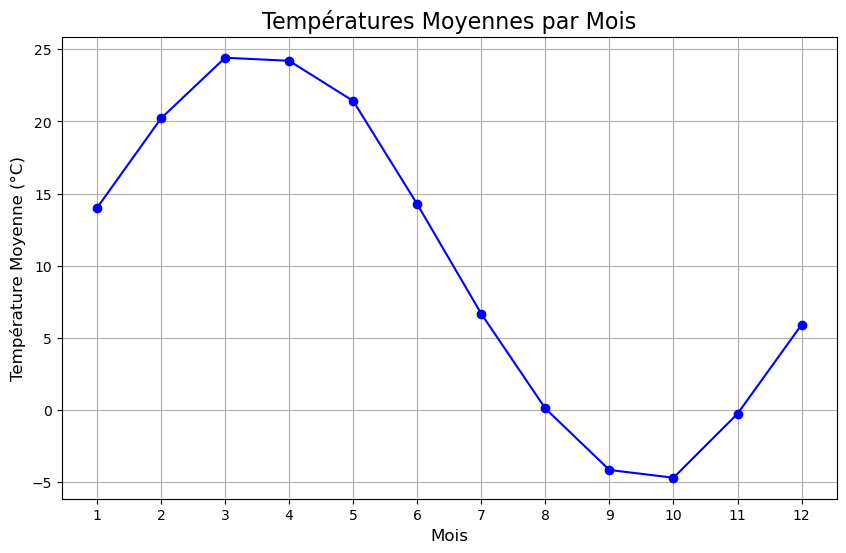

In [9]:
import matplotlib.pyplot as plt

# Courbe des températures mensuelles
plt.figure(figsize=(10, 6))
plt.plot(monthly_data['Month'], monthly_data['Avg_Temperature'], marker='o', color='blue')
plt.title('Températures Moyennes par Mois', fontsize=16)
plt.xlabel('Mois', fontsize=12)
plt.ylabel('Température Moyenne (°C)', fontsize=12)
plt.grid(True)
plt.xticks(range(1, 13))  # Assurer un affichage des 12 mois
plt.show()


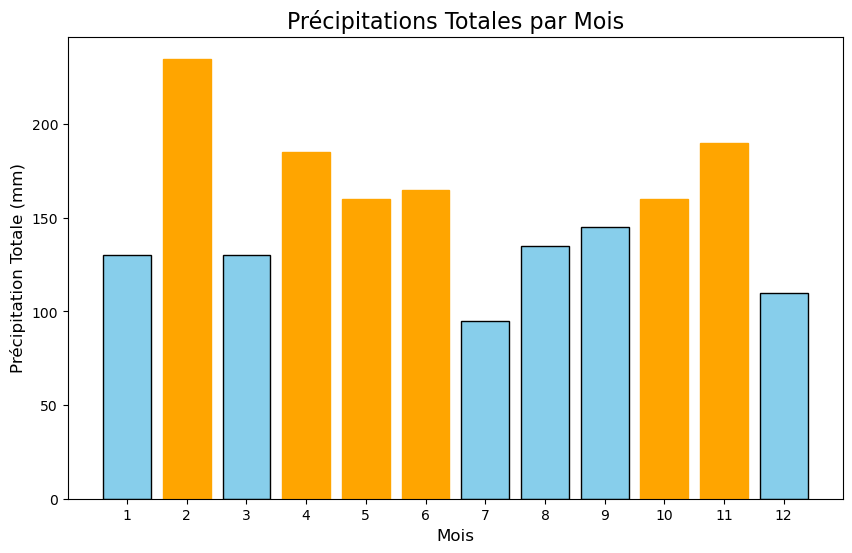

In [11]:
# Histogramme des précipitations mensuelles
plt.figure(figsize=(10, 6))
bars = plt.bar(monthly_data['Month'], monthly_data['Total_Precipitation'], color='skyblue', edgecolor='black')
plt.title('Précipitations Totales par Mois', fontsize=16)
plt.xlabel('Mois', fontsize=12)
plt.ylabel('Précipitation Totale (mm)', fontsize=12)
plt.xticks(range(1, 13))

# Colorier les barres selon les précipitations élevées/faibles
for bar in bars:
    if bar.get_height() > monthly_data['Total_Precipitation'].mean():
        bar.set_color('orange')

plt.show()


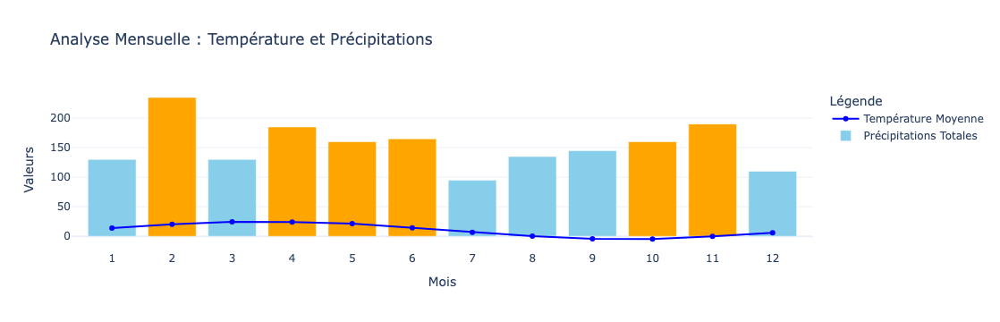

In [13]:
import plotly.graph_objects as go

# Créer une figure
fig = go.Figure()

# Ajouter la courbe des températures moyennes
fig.add_trace(go.Scatter(
    x=monthly_data['Month'],
    y=monthly_data['Avg_Temperature'],
    mode='lines+markers',
    name='Température Moyenne',
    line=dict(color='blue')
))

# Ajouter l'histogramme des précipitations totales
fig.add_trace(go.Bar(
    x=monthly_data['Month'],
    y=monthly_data['Total_Precipitation'],
    name='Précipitations Totales',
    marker_color=['orange' if val > monthly_data['Total_Precipitation'].mean() else 'skyblue' for val in monthly_data['Total_Precipitation']]
))

# Ajouter les titres et étiquettes
fig.update_layout(
    title='Analyse Mensuelle : Température et Précipitations',
    xaxis_title='Mois',
    yaxis_title='Valeurs',
    xaxis=dict(tickmode='linear', tick0=1, dtick=1),
    legend=dict(title='Légende'),
    template='plotly_white'
)

# Afficher le tableau de bord interactif
fig.show()
